In [3]:
import os
import torch
import cv2

import matplotlib.pyplot as plt
import numpy as np

from bs4 import BeautifulSoup
from PIL import Image

In [ ]:
# If using Intel Arc GPU (like I am), run this cell.
import intel_extension_for_pytorch as ipex

In [5]:
DATA_ROOT_PATH = os.path.join("../", "guide3d")
ANNOTATION_FILE_PATH = os.path.join(DATA_ROOT_PATH, "annotations.xml")

In [159]:
with open(ANNOTATION_FILE_PATH, 'r') as f:
    xml_data = f.read()

xml_parsed = BeautifulSoup(xml_data, "lxml")

In [221]:
# For testing, read some arbitrary image.
# some_img = os.path.join(DATA_ROOT_PATH, xml_parsed.camera["image"])
some_img = os.path.join(DATA_ROOT_PATH, "1-bca-straight-1-2", "241.png")
some_img = Image.open(some_img)

some_img.size

(1024, 1024)

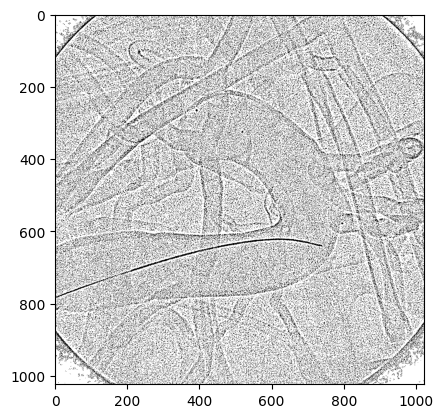

In [222]:
edges = cv2.adaptiveThreshold(np.array(some_img), 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C,\
 cv2.THRESH_BINARY, 11, 2)

plt.imshow(edges, cmap = "gray", vmin = 0, vmax = 255)


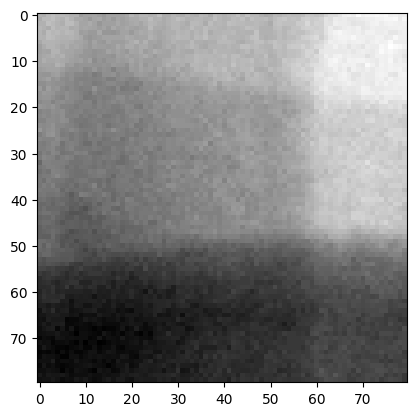

In [223]:
plt.imshow(np.array(some_img)[592-40:592+40, 192-40:192+40], cmap = "gray")

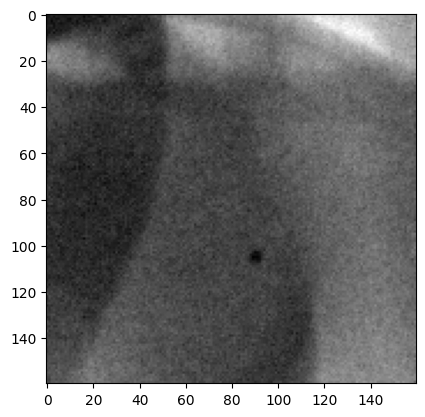

In [224]:
plt.imshow(np.array(some_img)[301-80:301+80, 508-80:508+80], cmap = "gray")

In [203]:
images = np.array([])


camera_xml_nodes = xml_parsed.findAll("camera")
reconstruction_xml_nodes = xml_parsed.findAll("reconstruction")

for each_camera_node in camera_xml_nodes:
    mask = np.zeros((1024, 1024))
    images = np.append(images, each_camera_node["image"])

    print(each_camera_node, recon)


<camera image="1-bca-angle-5-1/000.png" number="1" points="514,298;508,301;510,305;515,311;525,324;533,333;539,344;544,354;549,369;553,382;554,396;554,407;551,426;548,444;537,474;524,496;514,509;503,522;490,536;469,551;469,551;451,563;432,573;407,584;374,592;346,594;302,597;192,592;100,592;3,593"></camera> <reconstruction points="10.9530,13.3997,15.2375;10.9915,13.5921,15.2763;11.0244,13.7858,15.3135;11.0554,13.9800,15.3496;11.0881,14.1742,15.3850;11.1178,14.3684,15.4223;11.1477,14.5624,15.4607;11.1775,14.7562,15.4997;11.2068,14.9501,15.5392;11.2336,15.1442,15.5791;11.2565,15.3386,15.6202;11.2751,15.5332,15.6624;11.2882,15.7280,15.7055;11.3058,15.9228,15.7472;11.3216,16.1175,15.7903;11.3343,16.3120,15.8350;11.3432,16.5064,15.8813;11.3504,16.7006,15.9286;11.3551,16.8946,15.9766;11.3566,17.0886,16.0253;11.3543,17.2823,16.0750;11.3502,17.4758,16.1256;11.3438,17.6689,16.1770;11.3345,17.8617,16.2295;11.3254,18.0543,16.2827;11.3172,18.2468,16.3361;11.3098,18.4393,16.3900;11.3026,18.6316,16.4

In [214]:
mask = np.zeros((1024, 1024))

for i in range(len(each_camera_node["points"].split(';'))):
    j, k = each_camera_node["points"].split(';')[i].split(',')
    print(k, j)

    x = np.append(x, k)
    y = np.append(y, j)

    mask[int(k)][int(j)] = 1
    

642 737
639 729
637 720
635 711
633 701
631 692
629 683
627 673
625 659
624 644
623 628
622 605
624 582
627 559
630 531
636 494
651 422
669 346
689 276
712 207
746 105
770 38
784 0


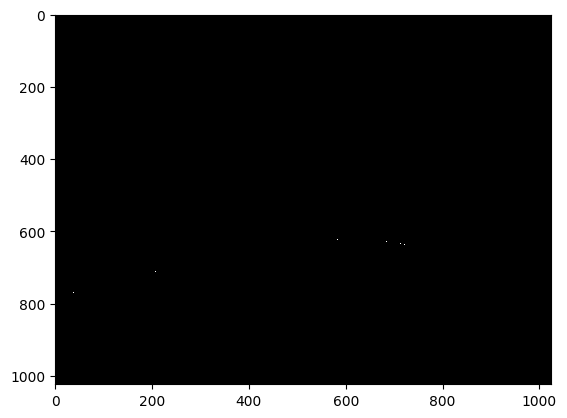

In [217]:
plt.imshow(np.array(mask), interpolation = "nearest", aspect = "auto", cmap = "gray")

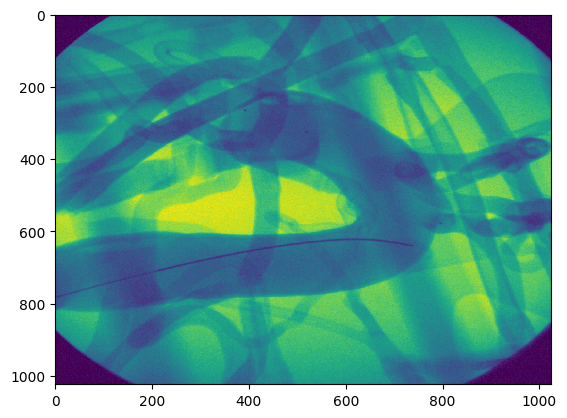

In [233]:
X = np.array(some_img) * mask

#plt.imshow(X, cmap = "gray", interpolation = "nearest", aspect = "auto")
plt.imshow(np.array(some_img), interpolation = "nearest", aspect = "auto")